In [1]:
import os,sys
import numpy as np
import xarray as xr
import zarr
# plot
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from matplotlib.colors import Colormap

# plota
import matplotlib.pyplot as plt
from matplotlib.colors import Colormap
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import matplotlib.cm as cm
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
from matplotlib.colors import from_levels_and_colors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
CB_colors = {
	'blue':	'#377eb8',
	'orange':  '#ff7f00',
	'green':   '#4daf4a',
	'pink':	'#f781bf',
	'brown':   '#a65628',
	'purple':  '#984ea3',
	'gray':	'#999999',
	'red': 	'#e41a1c',
	'yellow':  '#dede00'
}

# from dask.distributed import Client
import multiprocessing.popen_spawn_posix
from distributed import Client

c = Client()
c

/gpfslocalsup/pub/anaconda-py3/2020.11/envs/climate_science/lib/python3.9/site-packages/distributed/node.py:151: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 43809 instead
  warnings.warn(


Client Scheduler: tcp://127.0.0.1:37995 Dashboard: http://127.0.0.1:43809/status,Cluster Workers: 5 Cores: 10 Memory: 322.12 GB


In [2]:
dir_sc = os.environ['SCRATCH']
dir_work = os.environ['WORK']

In [3]:
diri="/gpfswork/rech/cli/rcli002/eORCA025.L75/eORCA025.L75-I/"
mesh_hgr = xr.open_dataset(diri+'mesh_hgr.nc').squeeze()
tmask = mesh_hgr.tmask[0].drop_vars('nav_lev').drop_vars('time_counter')
nav_lon =  mesh_hgr.nav_lon
nav_lat =  mesh_hgr.nav_lat

centim = 1/2.54  # centimeters in inches
proj = ccrs.Robinson(central_longitude=200) #ccrs.Robinson()
crs = ccrs.PlateCarree()
rivers = cartopy.feature.NaturalEarthFeature(category='physical', name='rivers_lake_centerlines',scale='50m',facecolor='none',edgecolor='b')
land  = cfeature.NaturalEarthFeature(name='land',scale='50m', category='physical',facecolor='grey')
label_style = {'size': 8, 'color': '#BDBDBD', 'weight': 'normal'}

lim_sup = 2 # cm²
lim_inf = -0.5
# lim_l4 = 20 # %

cmap12 = cm.YlGn
cmap34 = cm.RdYlBu_r 

In [4]:
diro = dir_work + "/ETUDE3/ENS_VAR_BUDGET/PLOTS/"

# load data

In [5]:
# load data
dir_data = dir_work + "/ETUDE3/ENS_VAR_BUDGET/data4analyses/"
nexp = "ES"

# for the full depth decomposition and the SLA
ds_HALO = xr.open_dataset(dir_data+nexp+"/HALO/var_terms_39_0_bottom.zarr", engine="zarr")
ds_THERMO = xr.open_dataset(dir_data+nexp+"/THERMO/var_terms_39_0_bottom.zarr", engine="zarr")
ds_STERIC = xr.open_dataset(dir_data+nexp+"/STERIC/var_terms_39_0_bottom.zarr", engine="zarr")


In [6]:
ds_simask = xr.open_dataset(dir_work+"/ETUDE3/ENS_VAR_BUDGET/raw_data/"+nexp+"/"+nexp+"_SIMASK15_E1980_2018.zarr", engine="zarr").SIMASK15_E
sum_simsk = ds_simask.sum(('ens','time_counter')).compute()
si_mask = (sum_simsk.where(sum_simsk==390,0)/390)

In [7]:
# compute the signal to noise ration: we will plot as shading where the SNR <1
SNR_HALO = (ds_HALO.forced_var / (ds_HALO.intrinsic_var - ds_HALO.res_var) ) .where( si_mask)
intermediate_mask = SNR_HALO.where(SNR_HALO<1,0)
SNR_HALO_below1 = intermediate_mask.where(intermediate_mask ==0, 1)

intermediate_mask = SNR_HALO.where(SNR_HALO>=1,0)
SNR_HALO_above1 = intermediate_mask.where(intermediate_mask ==0, 1)

# compute the signal to noise ration: we will plot as shading where the SNR <1
SNR_THERMO = (ds_THERMO.forced_var / (ds_THERMO.intrinsic_var - ds_THERMO.res_var) ) .where( si_mask)
intermediate_mask = SNR_THERMO.where(SNR_THERMO<1,0)
SNR_THERMO_below1 = intermediate_mask.where(intermediate_mask ==0, 1)

intermediate_mask = SNR_THERMO.where(SNR_THERMO>=1,0)
SNR_THERMO_above1 = intermediate_mask.where(intermediate_mask ==0, 1)



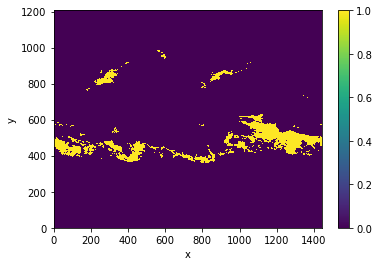

In [7]:
# SNR_HALO_below1.plot()
SNR_THERMO_below1.plot()
# si_mask.plot()

# compare halo versus thermo with respect to steric

In [39]:
# compute the signal to noire ration: we will plot as shading where the SRN <1
SNR_thermo_halo = (ds_THERMO.tot_var / ds_HALO.tot_var ) .where( tmask) .where( si_mask)
intermediate_mask = SNR_thermo_halo.where(SNR_thermo_halo<1,0)
SNR_thermo_halo_below1 = intermediate_mask.where(intermediate_mask ==0, 1)


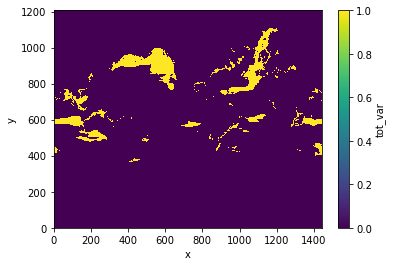

In [40]:
SNR_thermo_halo_below1.plot()

/gpfslocalsup/pub/anaconda-py3/2020.11/envs/climate_science/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1597: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


figure2_SNR_halo_thermo.png


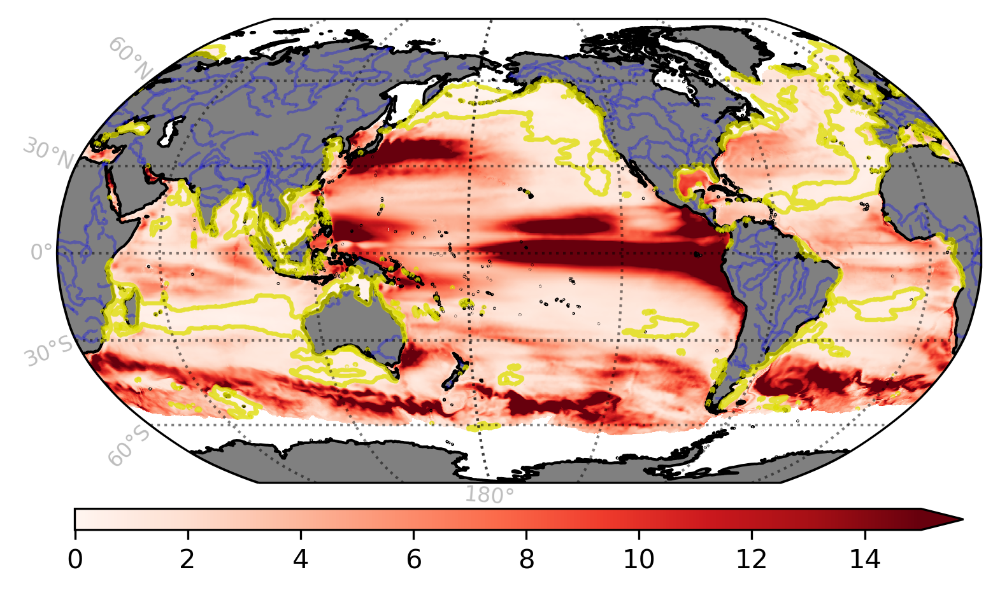

In [41]:
lim_sup = 15
lim_inf = 0

cmap12 = cm.Reds

fig, axa = plt.subplots(1, 1,figsize=(10,4),facecolor='white',dpi=300,subplot_kw={'projection': proj})

for ax_name in [axa]:
    # ax_name.coastlines()
    gl = ax_name.gridlines(color='k',alpha=0.5, linestyle='--',linewidth=0.33,lw=1,ls=':', draw_labels=True)#, y_inline=True,)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = label_style; gl.ylabel_style = label_style
    ax_name.add_feature(land, edgecolor='black')
    clr2 = ax_name.add_feature(rivers,alpha=0.3,facecolor='none',edgecolor='blue',zorder=6)

cs= axa.pcolormesh(nav_lon, nav_lat, SNR_thermo_halo, shading='flat',cmap =cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)
axa.contour(nav_lon,nav_lat,SNR_thermo_halo_below1.where(nav_lon<0),1,colors=CB_colors['yellow'], transform=crs, alpha=0.5)
axa.contour(nav_lon,nav_lat,SNR_thermo_halo_below1.where(nav_lon>0),1,colors=CB_colors['yellow'],transform=crs, alpha=0.5)


############----------colorbar---------------
# fig.subplots_adjust(bottom=0.18)
# cbar_ax = fig.add_axes([0.15, 0.16, 0.7, 0.01])  #(left, bottom, width, height)

# ticklabels=np.arange(-0.5,2.5,0.5)
# new_tickslabels = [np.round(10**y,1) for y in ticklabels]

cbar = fig.colorbar(cs, extend='max', orientation='horizontal', pad = 0.045, shrink=0.6, aspect= 40) #ticks=bounds, cax=cbar_ax,
cbar.ax.tick_params(labelsize=10)
# cbar.set_ticklabels(new_tickslabels)
# cbar.ax.set_title('$log_{10}(cm^{2})$',size=14)
# cbar.set_label(r'$log_{10}(cm^{2})$', fontsize=24)
# cbar.set_ticks(ticks=np.arange(-0.5,2.5,0.5))

namo = "figure2_SNR_halo_thermo.png"
print(namo)
# fig.tight_layout(pad=0, h_pad=5, w_pad=0)
plt.show()
fig.savefig(diro+namo, facecolor=fig.get_facecolor(), bbox_inches='tight') #,edgecolor='none',
# plt.close(fig)

# comparweith respect to steric

In [29]:
def perc_tot_var(ds, ds_ref):
    return ((ds.tot_var / ds_ref.tot_var )*100) .where( tmask) .where( si_mask)

In [30]:
percthermo = perc_tot_var(ds_THERMO,ds_STERIC)
perchalo = perc_tot_var(ds_HALO,ds_STERIC)

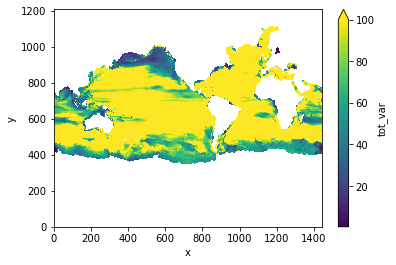

In [37]:
percthermo.plot(vmax=100)

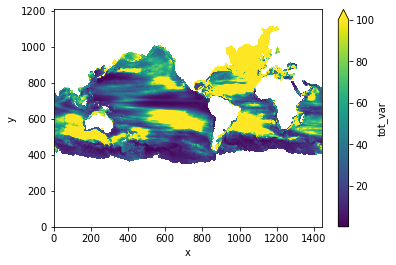

In [38]:
perchalo.plot(vmax=100)

# PLOT figure

In [8]:
def vectorize(cs):
    """
    Vectorize contourf plots to reduce weight of figures saved as PDFs.
    """
    for c in cs.collections:
        c.set_rasterized(True)

alphaHatch = 0.05

<ipython-input-9-b3622dfc5591>:33: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  cs= axa.pcolormesh(nav_lon, nav_lat, xr.ufuncs.log10(ds_THERMO.tot_var * si_mask), shading='flat',cmap =cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)
/gpfslocalsup/pub/anaconda-py3/2020.11/envs/climate_science/lib/python3.9/site-packages/xarray/core/dataarray.py:3078: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  da = self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/gpfslocalsup/pub/anaconda-py3/2020.11/envs/climate_science/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1597: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  X, Y, C, shading = self._pcol

figure2.png


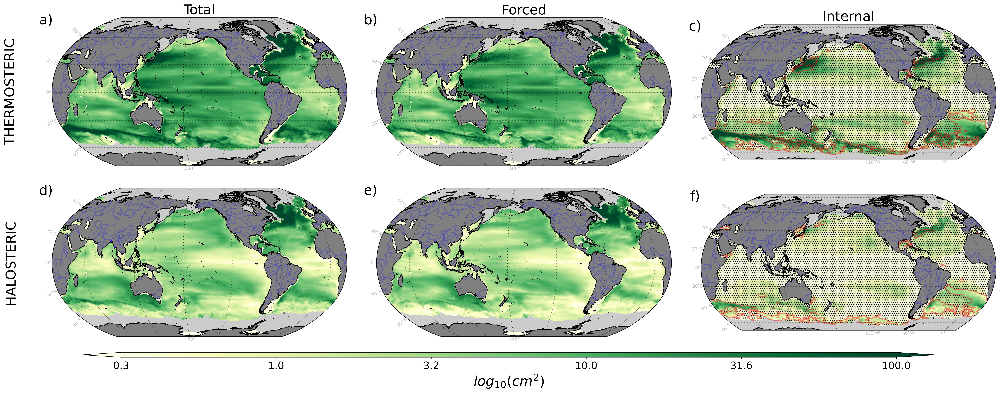

In [9]:
fig, [(axa,axb,axc),(axd,axe,axf)] = plt.subplots(2, 3,figsize=(30,12),facecolor='white', \
                                                                             dpi=300,subplot_kw={'projection': proj})
plt.subplots_adjust(wspace=0.1, hspace=0)

axa.text(-0.14, 0.5, "THERMOSTERIC", fontsize=24, horizontalalignment='center', verticalalignment='center',rotation='vertical', transform=axa.transAxes)
axd.text(-0.14, 0.5,  "HALOSTERIC", fontsize=24, horizontalalignment='center', verticalalignment='center',rotation='vertical', transform=axd.transAxes)

axa.set_title("Total", fontsize=24) 
axb.set_title("Forced", fontsize=24) 
axc.set_title("Internal", fontsize=24)

axa.text(-0.02, 0.98, 'a)', fontsize=24, horizontalalignment='center', verticalalignment='center', transform=axa.transAxes)
axb.text(-0.02, 0.98, 'b)', fontsize=24, horizontalalignment='center', verticalalignment='center', transform=axb.transAxes)
axc.text(-0.02, 0.98, 'c)', fontsize=24, horizontalalignment='center', verticalalignment='center', transform=axc.transAxes)
axd.text(-0.02, 0.98, 'd)', fontsize=24, horizontalalignment='center', verticalalignment='center', transform=axd.transAxes)
axe.text(-0.02, 0.98, 'e)', fontsize=24, horizontalalignment='center', verticalalignment='center', transform=axe.transAxes)
axf.text(-0.02, 0.98, 'f)', fontsize=24, horizontalalignment='center', verticalalignment='center', transform=axf.transAxes)

for ax_name in [axa,axb,axc,axd,axe,axf]:
    # ax_name.coastlines()
    gl = ax_name.gridlines(color='k',alpha=0.5, linestyle='--',linewidth=0.33,lw=1,ls=':', draw_labels=True)#, y_inline=True,)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = label_style; gl.ylabel_style = label_style
    ax_name.add_feature(land, edgecolor='black')
    clr2 = ax_name.add_feature(rivers,alpha=0.3,facecolor='none',edgecolor='blue',zorder=6)
    ax_name.contourf(nav_lon,nav_lat,si_mask.where(tmask).where(si_mask==0).where(nav_lon<0),1,colors=CB_colors['gray'], transform=crs, alpha=0.5)
    ax_name.contourf(nav_lon,nav_lat,si_mask.where(tmask).where(si_mask==0).where(nav_lon>0),1,colors=CB_colors['gray'],transform=crs, alpha=0.5)


# # #-------------------- premiere ligne: THERMO --------------------------------------
# # # ========total
cs= axa.pcolormesh(nav_lon, nav_lat, xr.ufuncs.log10(ds_THERMO.tot_var * si_mask), shading='flat',cmap =cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)

# # # ========FORCED
cs= axb.pcolormesh(nav_lon, nav_lat,  xr.ufuncs.log10(ds_THERMO.forced_var * si_mask), shading='flat',cmap =cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)
# # # ========internal
cs= axc.pcolormesh(nav_lon, nav_lat, xr.ufuncs.log10( (ds_THERMO.intrinsic_var - ds_THERMO.res_var) * si_mask), shading='flat',cmap = cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)


axc.contour(nav_lon,nav_lat,SNR_THERMO_below1.where(nav_lon<0),1,colors=CB_colors['red'], transform=crs, alpha=0.3)
axc.contour(nav_lon,nav_lat,SNR_THERMO_below1.where(nav_lon>0),1,colors=CB_colors['red'],transform=crs, alpha=0.3)

cs2_1= axc.contourf(nav_lon, nav_lat, SNR_THERMO_above1.where(SNR_THERMO_above1==1).where(tmask).where(nav_lon<0),transform=crs, colors='none',alpha=alphaHatch,hatches=['...'*1], add_colorbar=False)
vectorize(cs2_1)
cs2_2= axc.contourf(nav_lon, nav_lat, SNR_THERMO_above1.where(SNR_THERMO_above1==1).where(tmask).where(nav_lon>0),transform=crs, colors='none',alpha=alphaHatch,hatches=['...'*1], add_colorbar=False)
vectorize(cs2_2)


#--------------------- deuxieme ligne : HALO --------------------------------------
# ========total
cs= axd.pcolormesh(nav_lon, nav_lat, xr.ufuncs.log10(ds_HALO.tot_var* si_mask),shading='flat', cmap =cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)
# # ========FORCED
cs= axe.pcolormesh(nav_lon, nav_lat, xr.ufuncs.log10( ds_HALO.forced_var * si_mask), shading='flat',cmap =cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)
# # # ========internal
cs= axf.pcolormesh(nav_lon, nav_lat, xr.ufuncs.log10( (ds_HALO.intrinsic_var - ds_HALO.res_var) * si_mask), shading='flat',cmap =cmap12, transform=crs, vmin =lim_inf, vmax=lim_sup)

axf.contour(nav_lon,nav_lat,SNR_HALO_below1.where(nav_lon<0),1,colors=CB_colors['red'], transform=crs, alpha=0.3)
axf.contour(nav_lon,nav_lat,SNR_HALO_below1.where(nav_lon>0),1,colors=CB_colors['red'],transform=crs, alpha=0.3)

cs2_1= axf.contourf(nav_lon, nav_lat, SNR_HALO_above1.where(SNR_HALO_above1==1).where(tmask).where(nav_lon<0),transform=crs, colors='none',alpha=alphaHatch,hatches=['...'*1], add_colorbar=False)
vectorize(cs2_1)
cs2_2= axf.contourf(nav_lon, nav_lat, SNR_HALO_above1.where(SNR_HALO_above1==1).where(tmask).where(nav_lon>0),transform=crs, colors='none',alpha=alphaHatch,hatches=['...'*1], add_colorbar=False)
vectorize(cs2_2)


############--------------------------------------------
fig.subplots_adjust(bottom=0.18)
cbar_ax = fig.add_axes([0.15, 0.16, 0.7, 0.01])  #(left, bottom, width, height)

ticklabels=np.arange(-0.5,2.5,0.5)
new_tickslabels = [np.round(10**y,1) for y in ticklabels]

cbar = fig.colorbar(cs,extend='both', cax=cbar_ax, orientation='horizontal', ticks=ticklabels) # pad = 0.025, shrink=0.9) ticks=bounds,
cbar.ax.tick_params(labelsize=18)
cbar.set_ticklabels(new_tickslabels)
# cbar.ax.set_title('$log_{10}(cm^{2})$',size=14)
cbar.set_label(r'$log_{10}(cm^{2})$', fontsize=24)
# cbar.set_ticks(ticks=np.arange(-0.5,2.5,0.5))

namo = "figure2.png"
print(namo)
# fig.tight_layout(pad=0, h_pad=5, w_pad=0)
plt.show()
fig.savefig(diro+namo, facecolor=fig.get_facecolor(), bbox_inches='tight') #,edgecolor='none',
# plt.close(fig)

In [14]:
diro+namo

'/lustre/fswork/projects/rech/cli/uor98hu/ETUDE3/ENS_VAR_BUDGET/PLOTS/figure2.png'